# Визуализация.

Датасет представляет собой коллекцию медицинских и демографических данных пациентов, а также их статус диабета (положительный или отрицательный). Данные включают такие характеристики, как возраст, пол, индекс массы тела (ИМТ), гипертония, сердечно-сосудистые заболевания, история курения, уровень HbA1c и уровень глюкозы в крови. 

В будущем этот датасет может быть использован для построения моделей машинного обучения для прогнозирования диабета у пациентов на основе их истории болезни и демографической информации. Это может быть полезно для медицинских работников при выявлении пациентов, которые могут быть подвержены риску развития диабета, и при разработке персонализированных планов лечения.

## Описание столбцов:

|Название| Описание |
|--|--|
|`gender`| Пол пациента |
|`age`| Возраст |
|`hypertension`| Гипертония —  это состояние, при котором кровяное давление в артериях постоянно повышено. Он принимает значения 0 или 1, где 0 означает отсутствие гипертонии, а 1 —  наличие гипертонии. |
|`heart_disease`| Болезни сердца —  это еще одно состояние, которое связано с повышенным риском развития диабета. Он также принимает значения 0 или 1, где 0 означает отсутствие сердечных заболеваний, а 1 —  наличие сердечных заболеваний. |
|`smoking_history`| Опыт курения —  также считается фактором риска развития диабета и может усугубить осложнения, связанные с диабетом. | 
|`bmi`| Это показатель количества жира в организме, основанный на весе и росте. Более высокие значения ИМТ связаны с повышенным риском развития диабета. Диапазон ИМТ в наборе данных составляет от 10,16 до 71,55. ИМТ менее 18,5 —  это недостаточный вес, 18,5-24,9 —  нормальный, 25-29,9 —  избыточный вес, а 30 и более —  ожирение. |
|`HbA1c_level`| Уровень HbA1c (гемоглобин A1c) —  это показатель среднего уровня сахара в крови человека за последние 2-3 месяца. Более высокий уровень указывает на больший риск развития диабета. В основном более 6,5% уровня HbA1c указывает на диабет. | 
|`blood_glucose_level`| Уровень глюкозы в крови —  это количество глюкозы в крови в определенный момент времени. Высокий уровень глюкозы в крови является основным признаком диабета. |
|`diabetes`| Диабет является целевой переменной (таргетом), при этом значение 1 указывает на наличие диабета, а 0 —  на его отсутствие. |

## Задание

Проведите визуализацию данных и попробуйте выяснить причины, от чего и с чем связаны основные причины наличия диабета у людей.

Ваша цель —  визуально с помощью графиков определить и доказать, что при наличии какого-либо фактора возможен риск развития диабета.

Этапы выполнения задания (наш pipeline):

1. Загрузка и предобработка данных (при необходимости)
2. Описательный анализ данных, просмотр данных
3. Построение гистограмм числовых переменных
4. Построение диаграмм размаха для определения наличия выбросов (ящики с усами) числовых переменных
5. Построение столбчатых диаграмм для категориальных переменных
6. Построение матрицы корреляции признаков (Phik или Пирсона)
7. Сравнение двух выборок
8. Общий вывод

    Справочные данные: 
- Показатель гликированного гемоглобина: 4-6,2 - нет диабета, 5,7-6,4 % - Преддиабет . 6,5 % и больше - диабет.
- Показатели Глюкозы в крови от 59 до 99 мг в 100 мл крови - Норма
--------------------------

## Загрузка данных

In [1]:
import numpy as np
import pandas as pd
from scipy import stats

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go


import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

In [2]:
# path = r'G:\Мой диск\1._Study\1._1t\1._DS\ДЗ_1T\4\diabetes_prediction_dataset.csv'
df = pd.read_csv("diabetes_prediction_dataset.csv", encoding='utf-8') 
df.shape

(100000, 9)

In [4]:
df.head(4)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0


In [3]:
df.sample(5)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
29314,Male,64.0,0,0,No Info,24.53,4.5,90,0
46521,Male,12.0,0,0,No Info,33.73,6.1,85,0
56950,Female,22.0,0,0,never,19.97,4.0,158,0
76707,Male,80.0,0,0,No Info,24.57,6.2,100,0
47157,Female,52.0,0,0,never,24.00,6.0,85,0


## Описательный анализ данных

Рассмотрите данные —  изучите медианы, средние, дисперсии и т.д. 

Что можете сказать о данных? Сделайте вывод.

In [89]:
df.describe(include='all').fillna('-')

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
count,100000,100000.0,100000.0,100000.0,100000,100000.0,100000.0,100000.0,100000.0
unique,3,-,-,-,6,-,-,-,-
top,Female,-,-,-,No Info,-,-,-,-
freq,58552,-,-,-,35816,-,-,-,-
mean,-,41.885856,0.07485,0.03942,-,27.320767,5.527507,138.05806,0.085
std,-,22.51684,0.26315,0.194593,-,6.636783,1.070672,40.708136,0.278883
min,-,0.08,0.0,0.0,-,10.01,3.5,80.0,0.0
25%,-,24.0,0.0,0.0,-,23.63,4.8,100.0,0.0
50%,-,43.0,0.0,0.0,-,27.32,5.8,140.0,0.0
75%,-,60.0,0.0,0.0,-,29.58,6.2,159.0,0.0


In [90]:
df.smoking_history.value_counts()

smoking_history
No Info        35816
never          35095
former          9352
current         9286
not current     6447
ever            4004
Name: count, dtype: int64

- Третий пол, будем убирать строки ( в столбце gender - unique = 3)

In [91]:
df.age.value_counts()

age
80.00    5621
51.00    1619
47.00    1574
48.00    1568
53.00    1542
         ... 
0.48       83
1.00       83
0.40       66
0.16       59
0.08       36
Name: count, Length: 102, dtype: int64

- в столбце возраст ошибочные значения (возраст 0.48)

In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   smoking_history      100000 non-null  object 
 5   bmi                  100000 non-null  float64
 6   HbA1c_level          100000 non-null  float64
 7   blood_glucose_level  100000 non-null  int64  
 8   diabetes             100000 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 6.9+ MB


In [93]:
categorical_columns = df.select_dtypes(include=['object']).columns 
# используем метод `.select_dtypes()` с аргументом `include=['object']`, чтобы выбрать только те столбцы, которые имеют тип "object"

for category in categorical_columns:            # принято решение обойти в цикле каждую категориальную колонку
    print("Статистика для столбца -", category)
    print(df[category].value_counts())          # выводим количество уникальных значений в столбце
    print(df[category].describe())              # выводим описательные статистики для столбца
    print(f'{"-"*75}')

Статистика для столбца - gender
gender
Female    58552
Male      41430
Other        18
Name: count, dtype: int64
count     100000
unique         3
top       Female
freq       58552
Name: gender, dtype: object
---------------------------------------------------------------------------
Статистика для столбца - smoking_history
smoking_history
No Info        35816
never          35095
former          9352
current         9286
not current     6447
ever            4004
Name: count, dtype: int64
count      100000
unique          6
top       No Info
freq        35816
Name: smoking_history, dtype: object
---------------------------------------------------------------------------


**Вывод:**
- в выборке присутствуют не корректные данные по возрасту и полу людей
- из-за отсутствия у `35816` людей (`35.8% `общей выборки) информации в категории smoking_history мы не можем сделать точный вывод о превалирующей подгруппе в данной категории
- Очень разнятся средние и медианные данные в датасэте это говорит о не нормальном распредилении данных в датасэте.
- У большинства пациентов нет диабета.
----------------------------

## Предобработка данных

### Дубликаты

Предобработайте датасет —  проверьте на наличие дубликатов и удалите, если они есть.

- удаляем лишний пол

In [94]:
df.drop(df[df['gender'].str.contains('Other')].index, inplace=True)

In [95]:
print(df["gender"].describe()) 

count      99982
unique         2
top       Female
freq       58552
Name: gender, dtype: object


In [96]:
print(f'Количество дубликатов в DataFrame = {df.duplicated().sum()}')

Количество дубликатов в DataFrame = 3854


In [97]:
df.drop_duplicates(inplace = True)

In [98]:
print(f'Количество дубликатов в DataFrame = {df.duplicated().sum()}')

Количество дубликатов в DataFrame = 0


### Отсутствующие значения

Предобработайте датасет — проверьте на наличие NaN и удалите или заполните значения.

In [99]:
df.isna().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64

- NaN отсутствуют

### Изменение типа данных

Рассмотрев все данные, замените типы на нужные (при необходимости):

- Если есть числа — на `int` или `float`
- Если категории — можно оставить `object`

In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96128 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   gender               96128 non-null  object 
 1   age                  96128 non-null  float64
 2   hypertension         96128 non-null  int64  
 3   heart_disease        96128 non-null  int64  
 4   smoking_history      96128 non-null  object 
 5   bmi                  96128 non-null  float64
 6   HbA1c_level          96128 non-null  float64
 7   blood_glucose_level  96128 non-null  int64  
 8   diabetes             96128 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 7.3+ MB


**Вывод:**
- Dtype - корректны
------------------------

## Визуализация

Построим графики:

1. Построение гистограмм числовых переменных
2. Построение диаграмм размаха для определения наличия выбросов (ящики с усами) числовых переменных
3. Построение столбчатых диаграмм для категориальных переменных
4. Построение матрицы корреляции признаков (Phik или Пирсона)

После построения опишите выборку. Что она из себя представляет? Есть ли зависимости?

     1. Построение гистограмм числовых переменных

In [101]:
# построение Матрицы корреляции для числовых данных (столбцов) нашего датасэта. 
# выполнено с помощью встроенной в Pandas функции
corr = df.corr(numeric_only=True).round(2)
corr.style.background_gradient(cmap="cool")

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
age,1.000000,0.260000,0.240000,0.340000,0.110000,0.110000,0.260000
hypertension,0.260000,1.000000,0.120000,0.150000,0.080000,0.080000,0.200000
heart_disease,0.240000,0.120000,1.000000,0.060000,0.070000,0.070000,0.170000
bmi,0.340000,0.150000,0.060000,1.000000,0.080000,0.090000,0.210000
HbA1c_level,0.110000,0.080000,0.070000,0.080000,1.000000,0.170000,0.410000
blood_glucose_level,0.110000,0.080000,0.070000,0.090000,0.170000,1.000000,0.420000
diabetes,0.260000,0.200000,0.170000,0.210000,0.410000,0.420000,1.000000


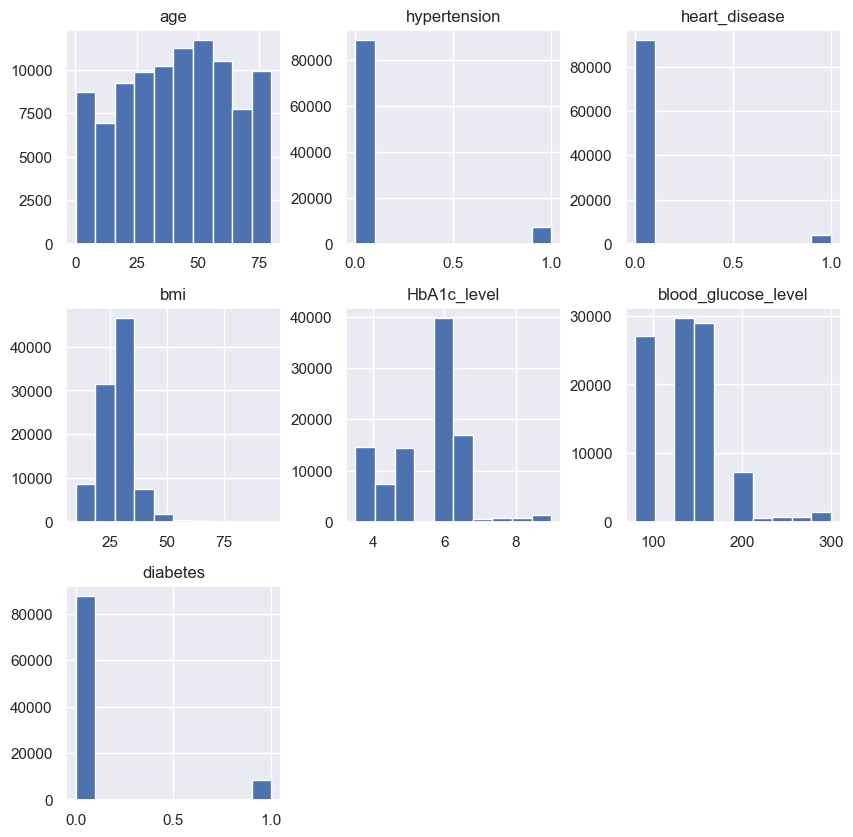

In [102]:
df.hist(figsize=(10,10))
plt.show()

- матрица показывает как коррелируют (вияют друг на друга) данные из числовых столбцов датафрейма.
- видно что обладают `высокой` зависимостью параметр наличия `диабета` и наличие высокох показателей `глюкозы` и `гемоглабина` в крови.
- так же есть зависимость возроста и показателя ИМТ.
- в обзорной гистограмме можно наблюдать распределения данных по выборке и сделать первые выводы о собраных зачениях в датасэте.

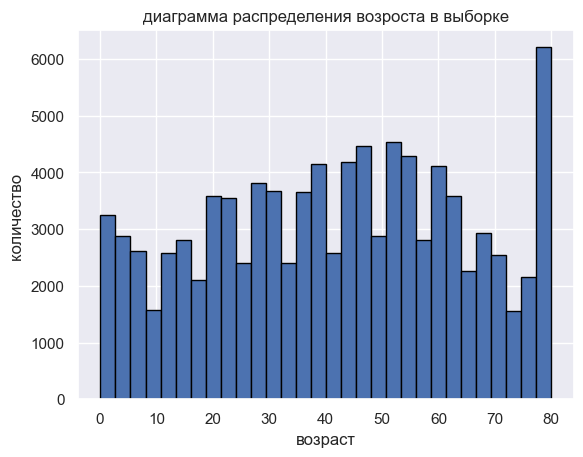

In [103]:
plt.hist(df.age, bins=30, edgecolor='black')
plt.title('диаграмма распределения возроста в выборке')
plt.xlabel('возраст')
plt.ylabel('количество ')
plt.show()

In [104]:
fig = px.histogram(df,
                   title='Распределение людей по возрасту в выборке',
                   x='age',
                   color='gender')
fig.show()

            - на мой взгляд plotly express информативней

- из диаграммы видно, что в выборке больше всего людей в возрасте 80 лет
- а также большое количество людей в возрасте до 10 лет

In [105]:
df = df.sort_values(by='age')
fig = px.scatter(df, x = 'age', y = 'bmi', color = 'smoking_history', facet_col='gender', facet_row = 'diabetes',
                  title= 'зависимость ИМТ от возроста, для полов и статуса диабета',
                    labels={'bmi':'ИМТ', 'age':'возраст', 'gender':'пол'})
fig.show()

- на диаграмме видно не корректные значения в датасете. Например есть текущие курильщики в возрасте 4 лет
- так же видно что чем старше, тем  меньше люди курят
- видно, что основная часть людей имеют диабет после 40 лет

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

c:\Users\Mi\AppData\Local\Programs\Python\Py

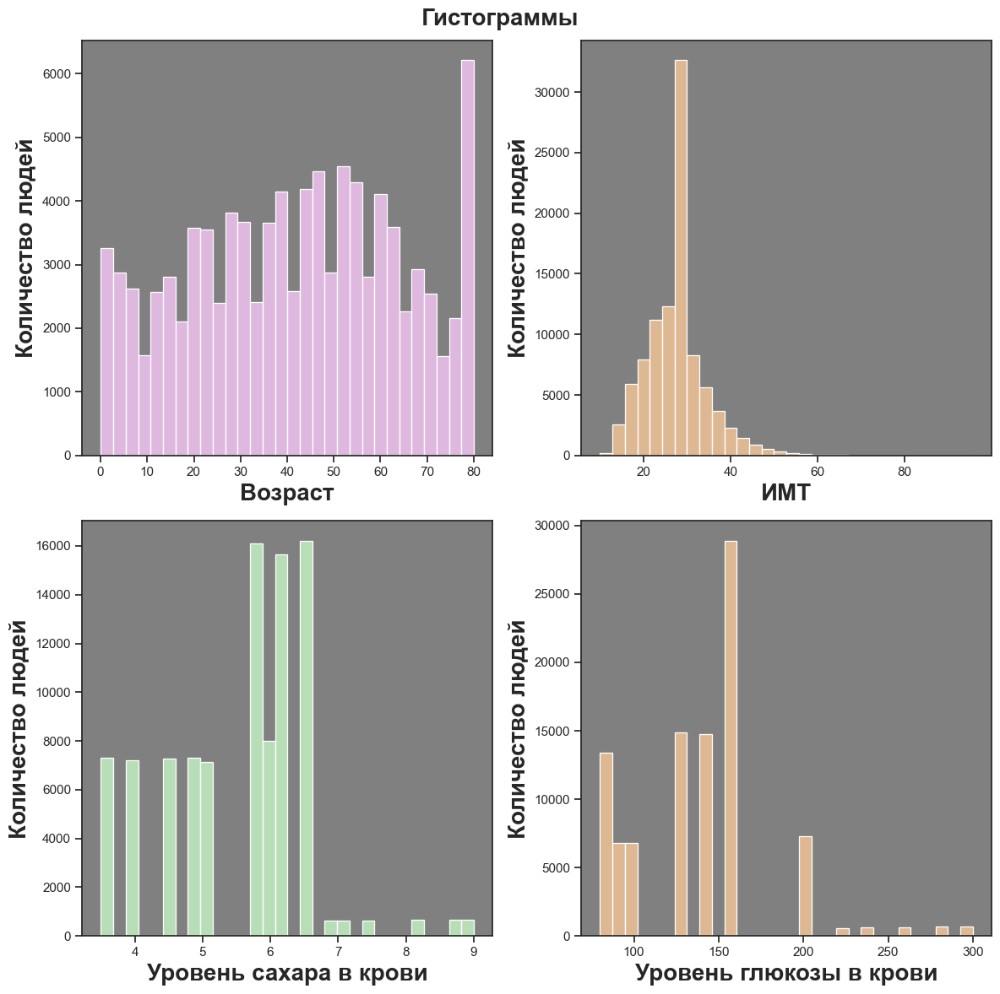

In [106]:
sns.set_theme(style='ticks')

fig, ax = plt.subplots(2, 2, figsize=(12, 12))
fig.suptitle('Гистограммы', fontsize=20, weight='bold')

plot_data = [
    (df.age, 'Возраст', '#FFCCFF'),
    (df.bmi, 'ИМТ', '#FFCC99'),
    (df.HbA1c_level, 'Уровень сахара в крови', '#CCFFCC'),
    (df.blood_glucose_level, 'Уровень глюкозы в крови', '#FFCC99')
]

for i, j in enumerate(plot_data):
    data, xlabel, color = j
    sns.histplot(data, ax=ax[i // 2, i % 2], bins=30, color=color)
    ax[i // 2, i % 2].set_xlabel(xlabel, fontsize=20, weight='bold')
    ax[i // 2, i % 2].set_ylabel('Количество людей', fontsize=20, weight='bold')
    ax[i // 2, i % 2].set_facecolor('#808080')

plt.tight_layout()
plt.show()

- на графиках видны распределения и всплески.
- в выборке в основном люди от 35 до 65 лет
- максимальное количество людей с нормальным ИМТ
- у большинства уровень сахара в пределах от 5.8-6.6
- у большинства уровень глюкозы в пределах 150 единиц

    2. Построение диаграмм размаха для определения наличия выбросов (ящики с усами) числовых переменных

In [123]:
fig = px.box(df, x="smoking_history", y="age")

fig.update_layout(
    xaxis_title="История корения",
    yaxis_title="Возраст"
)

fig.show()

- видны выбросы (бывший курильщик в 7 и 13 лет)

In [121]:
fig = make_subplots(rows=2, cols=2, vertical_spacing=0.2, horizontal_spacing=0.2)

fig.add_trace(px.box(df, x='age').data[0], row=1, col=1)
fig.add_trace(px.box(df, x='bmi').data[0], row=1, col=2)
fig.add_trace(px.box(df, x='HbA1c_level').data[0], row=2, col=1)
fig.add_trace(px.box(df, x='blood_glucose_level').data[0], row=2, col=2)

fig.update_xaxes(title_text="Возраст", row=1, col=1)
fig.update_yaxes(title_text="значение", row=1, col=1)

fig.update_xaxes(title_text="ИМТ", row=1, col=2)
fig.update_yaxes(title_text="значение", row=1, col=2)

fig.update_xaxes(title_text="Гликированный гемоглобин", row=2, col=1)
fig.update_yaxes(title_text="значение", row=2, col=1)

fig.update_xaxes(title_text="Глюкоза", row=2, col=2)
fig.update_yaxes(title_text="значение", row=2, col=2)

fig.show()

`3. Построение столбчатых диаграмм для категориальных переменных`

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



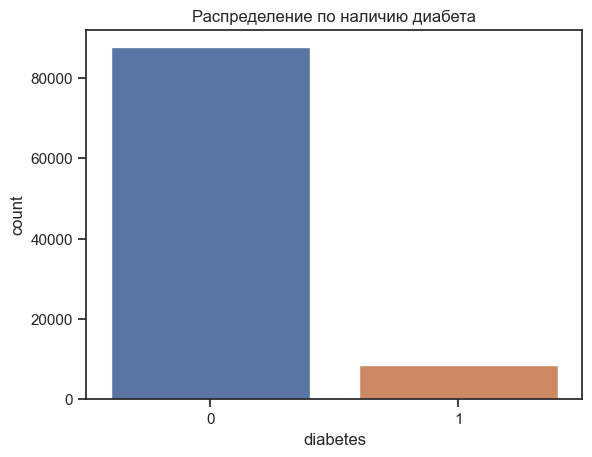

In [117]:
sns.countplot(x='diabetes', data=df)
plt.title("Распределение по наличию диабета")

plt.show()

- в выборке явно преобладают здоровые люди!

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



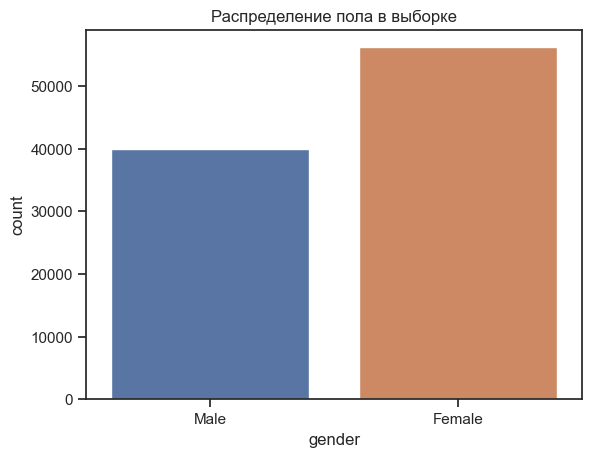

In [ ]:
sns.countplot(x='gender', data=df)
plt.title("Распределение пола в выборке")

plt.show()

- из данной столбчатой диаграммы видно, что в большинство женщин

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



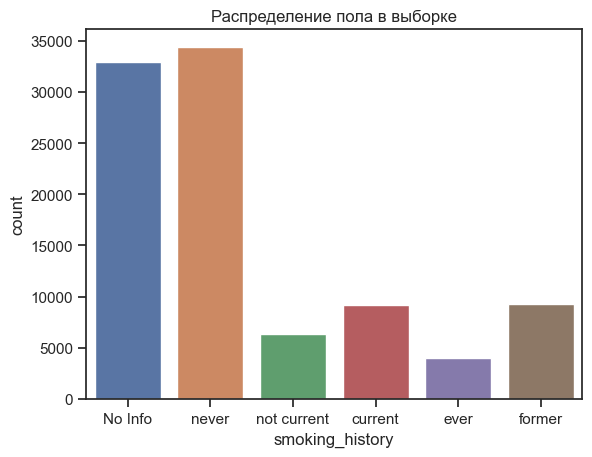

In [ ]:
sns.countplot(x='smoking_history', data=df)
plt.title("диаграммы курения")

plt.show()

- большинство людей из  выборке не курит и не курило !

`4. Построение матрицы корреляции признаков (Phik или Пирсона)`

In [ ]:
import phik
from phik.report import plot_correlation_matrix
from phik import report

interval columns not set, guessing: ['age', 'hypertension', 'heart_disease', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes']


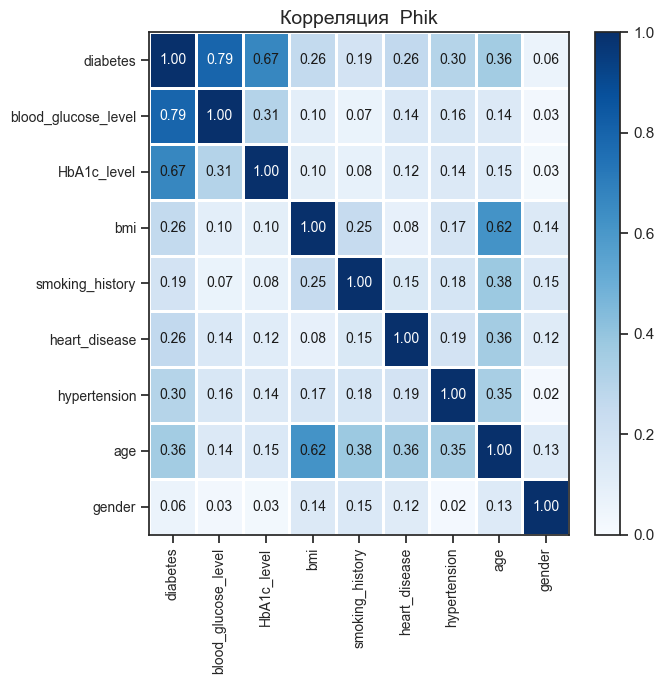

In [ ]:
phik_reserch = df.phik_matrix()
plot_correlation_matrix(phik_reserch.values,
                        x_labels=phik_reserch.columns,
                        y_labels=phik_reserch.columns,
                        vmin=0, vmax=1,
                        title="Корреляция  Phik",
                        figsize=(7,7), color_map='Blues')

plt.tight_layout()
plt.show()

- Построение матрицы корреляции признаков с помощью метода Пирсона

In [ ]:
df_pearson = df.select_dtypes(include=['float', 'int'])
pearson_corr_matrix = df_pearson.corr(method='pearson')

corr = pearson_corr_matrix.corr()
corr.style.background_gradient(cmap='coolwarm')

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
age,1.000000,0.061724,0.023672,0.280933,-0.367799,-0.352993,-0.192769
hypertension,0.061724,1.000000,-0.166644,-0.115397,-0.316035,-0.313027,-0.246533
heart_disease,0.023672,-0.166644,1.000000,-0.309406,-0.311748,-0.311160,-0.275773
bmi,0.280933,-0.115397,-0.309406,1.000000,-0.305617,-0.290142,-0.189733
HbA1c_level,-0.367799,-0.316035,-0.311748,-0.305617,1.000000,0.015413,0.380241
blood_glucose_level,-0.352993,-0.313027,-0.311160,-0.290142,0.015413,1.000000,0.418948
diabetes,-0.192769,-0.246533,-0.275773,-0.189733,0.380241,0.418948,1.000000


**`Вывод`:**
- с повышение ИМТ ухудшаются показатели гликированного гемоглобина, повышается вероятность сердечных болезней
- также в сильной корреляции с диабетом находится параметр глюкозы в крови.

-----------------------

## Сравнение выборок

После построения всех типов графиков, необходимо провести анализ:

Отобразите на одном графике две выборки — люди с диабетом и без и сравните их.

1. Для числовых признаков — гистограммы и ящики с усами.
2. Для категориальных — столбчатые диаграммы.

После напишите вывод, есть ли какая-то зависимость?

In [ ]:
histo = px.box(df, y='blood_glucose_level', x='HbA1c_level', color='diabetes', notched=True)

histo.show()

**`Вывод`:**
- чаще всего пациенты с диабетом встречаются в возрасте от 40 до 55 лет, при высоких  показателях глюкозы в крови
- опыт курения оказывает не значительное влияние на заболивание диабетом.

-------------------

## ЗАДАЧИ PRO

Мы провели базовый анализ выше и сделали выводы.

Но даёт ли этот результат полную картину? Наша цель — узнать, каков риск возникновения диабета у пациента.

Ваша задача — воспользоваться ранее приобретенными навыками и дополнить общий вывод. 

**Этапы:**

1) Разделите выборки и постройте дополнительные графики. Может стоит разделить на несколько выборок и сравнить графики там?
2) Постройте `pairplot` с параметром `hue=='diabetes'`. Может там тоже где-то кроется истина?
2) Постройте тепловую карту корреляции `Phik` и сделайте дополнительный вывод.
3) Дополните общий вывод. 

**Примечание:** задание не ограничено только этими этапами. Можно их дополнить — может стоит сделать фильтр данных, рассмотреть данные под другим углом и провести дополнительную аналитику? Средствами и методами не ограничены.

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

c:\Users\Mi\AppData\Local\Programs\Python\Python311\

<Figure size 200x200 with 0 Axes>

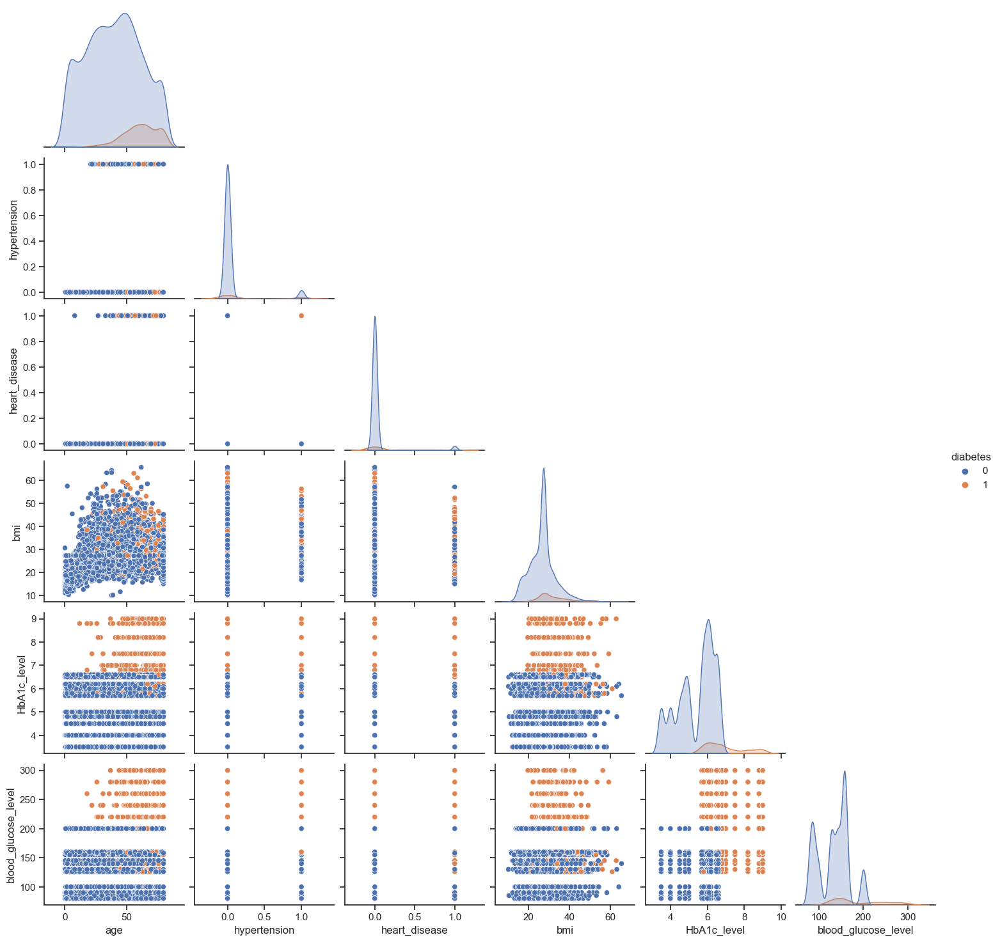

In [ ]:
plt.close('all')
plt.figure(figsize=(2,2))
sns.pairplot(df.sample(7000), corner=True, hue='diabetes') 

# Общий вывод


 - существуют зоны повышенной вероятности заболивания диабетом - это люди в возрасте от 40 до 55 лет, ведущие малоподвижный образ жизни,\
  имеющие показатели гемоглабина в диапазоне 5.6 - 6.5, а также имеющие уровень глюкозы в крови в диапазоне 125-200.
  - не важно какого пола люди.
  - явно прослеживается тенденция к увеличению ИМТ с увеличением возраста.
  -------------------------